# Clustering of clasroom sessions using a pair of words matrix

## Steps:
- Filtering words that are going to be used to build a matrix
- Build a matrix per session, where each row and column represents a word, and each cell represents the frequency of that pair of words appear in a sentence
- Use clustering algorithms to find 2 groups of clasroom sessions
- Measure the distance vector between the cluster's centroids
- Calculate the projection of each session into the distance vector
- Plot the projection of each session

### Defining preprocessing constants 

In [1]:
FILTER_STOP_WORDS = True
FILTER_BY_LENGTH = False
MIN_LENGTH = 30.0 #min
NORMALIZE_MATRIX_BY_LENGTH = True

## 0. Import, paths y definitions

C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)



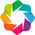

In [2]:
from __future__ import division
import string
import math
import os
import pandas as pd 
import numpy as np
import seaborn as sns
import nltk
%matplotlib inline
import matplotlib
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt
import json
import unidecode
import pickle
from scipy import stats
from text_clustering import text_preprocessing as tp, word_connection_matrix as wcm
import holoviews as hv
hv.extension('bokeh')

In [3]:
root_path = 'C:\Users\CATALINA ESPINOZA\Documents\clusters ciae'
data_path = os.path.join(root_path,'data')
output_path = os.path.join(root_path,'output')
by_grade_path = os.path.join(output_path,'textos_ulloa_by_curso')
by_grade_and_content = os.path.join(data_path,'textos_ulloa_by_grade_content')
by_content_path = os.path.join(output_path,'textos_ulloa_by_contenido')
all_files_path = os.path.join(data_path,'textos_ulloa')
all_classes = os.path.join(data_path,'clases_ulloa.txt')

In [4]:
all_documents_dict = tp.read_documents(all_files_path)

In [5]:
with open(os.path.join(output_path,'pickles','document_length_dict.pickle'),'rb') as f:
    document_length = pickle.load(f)

In [6]:
if FILTER_BY_LENGTH:
    filtered_documents = {}
    for document in all_documents_dict.keys():
        if document_length[document]>= MIN_LENGTH:
            filtered_documents[document] = all_documents_dict[document]
    all_documents_dict = filtered_documents

In [7]:
token_set = tp.get_all_token_set(all_documents_dict)
print(len(token_set))

14496


In [8]:
frequency_per_word = tp.get_frequency_per_word(all_documents_dict,token_set)

In [9]:
zipped = zip(token_set,frequency_per_word)
zipped.sort(key = lambda t: t[1], reverse=True)

In [10]:
# TODO: ver que hace tokenize porque no entiendo como cambia tanto el resultado de las palabras 
# mas frecuentes
print("N, Palabra, Frecuencia ")
for i in range(len(zipped)):
    print(str(i)+", "+str(zipped[i][0])+", "+str(zipped[i][1]))

N, Palabra, Frecuencia 
0, la, 12468
1, que, 12220
2, de, 11634
3, el, 7571
4, a, 6365
5, es, 5515
6, y, 4923
7, lo, 4789
8, se, 4717
9, no, 4227
10, en, 3809
11, por, 3785
12, un, 3108
13, porque, 2659
14, una, 2574
15, va, 2481
16, si, 2436
17, o, 2258
18, los, 2247
19, con, 2074
20, qué, 1979
21, está, 1878
22, ya, 1765
23, del, 1728
24, pero, 1589
25, eso, 1589
26, fuerza, 1564
27, para, 1551
28, más, 1531
29, cuando, 1501
30, como, 1446
31, entonces, 1375
32, yo, 1374
33, las, 1284
34, le, 1172
35, al, 1157
36, puede, 1035
37, tiene, 1010
38, te, 1001
39, hacer, 967
40, usted, 961
41, luz, 929
42, cómo, 918
43, ejemplo, 904
44, me, 896
45, su, 880
46, sí, 868
47, hay, 854
48, ser, 826
49, son, 793
50, ver, 775
51, tengo, 758
52, forma, 737
53, hace, 710
54, ahora, 705
55, dos, 683
56, esto, 669
57, mayor, 664
58, sea, 644
59, solamente, 644
60, campo, 634
61, velocidad, 619
62, todo, 610
63, estoy, 606
64, voy, 588
65, hacia, 580
66, decir, 554
67, otro, 552
68, también, 544
69, c

1926, 19, 12
1927, tuve, 12
1928, incide, 12
1929, hubiera, 12
1930, consume, 12
1931, signos, 12
1932, pez, 12
1933, invertidas, 12
1934, conveniente, 12
1935, puente, 12
1936, mil, 12
1937, lacerado, 12
1938, hubo, 12
1939, resolver, 12
1940, llevaste, 12
1941, pido, 12
1942, darle, 12
1943, chistes, 12
1944, n, 12
1945, toque, 12
1946, quedado, 12
1947, propia, 12
1948, trópico, 12
1949, quedaba, 12
1950, audífono, 12
1951, toca, 12
1952, detener, 12
1953, refracta, 12
1954, Ártico, 12
1955, torricelli, 12
1956, oportunidad, 12
1957, dibujado, 12
1958, evitar, 12
1959, defecto, 12
1960, quema, 12
1961, frecuencias, 12
1962, dile, 12
1963, lanza, 12
1964, ampolletas, 12
1965, detenerse, 12
1966, inversión, 12
1967, proyecto, 12
1968, llegado, 12
1969, geográfico, 12
1970, genética, 11
1971, yuliana, 11
1972, honda, 11
1973, comprar, 11
1974, oficio, 11
1975, proporcionales, 11
1976, colón, 11
1977, brasil, 11
1978, observé, 11
1979, sal, 11
1980, japón, 11
1981, multiplicación, 11
19

2944, cliente, 6
2945, loción, 6
2946, cristal, 6
2947, puerto, 6
2948, pocas, 6
2949, alusión, 6
2950, visa, 6
2951, compresión, 6
2952, ca, 6
2953, harto, 6
2954, sumó, 6
2955, déjame, 6
2956, banco, 6
2957, +, 6
2958, preguntado, 6
2959, córdoba, 6
2960, eclipse, 6
2961, comercial, 6
2962, bares, 6
2963, equidad, 6
2964, perico, 6
2965, atraen, 6
2966, diferencias, 6
2967, bella, 6
2968, mínimo, 6
2969, circulación, 6
2970, transformando, 6
2971, precios, 6
2972, levantando, 6
2973, aventura, 6
2974, bravo, 6
2975, cargo, 6
2976, manejar, 6
2977, resultados, 6
2978, mejorando, 6
2979, 300.000, 6
2980, alcanzó, 6
2981, trigonométricas, 6
2982, bodega, 6
2983, activar, 6
2984, visualmente, 6
2985, guillermo, 6
2986, transforman, 6
2987, domingo, 6
2988, hojas, 6
2989, ocurrió, 6
2990, you, 6
2991, tomé, 6
2992, nano, 6
2993, conectadas, 6
2994, kilogramos, 6
2995, vecino, 6
2996, tío, 6
2997, porfa, 6
2998, bici, 6
2999, cerveza, 6
3000, pasos, 6
3001, navidad, 6
3002, sismos, 6
3003,

4425, corto, 3
4426, silva, 3
4427, conocen, 3
4428, obtención, 3
4429, vuelos, 3
4430, frases, 3
4431, digan, 3
4432, escalera, 3
4433, múltiple, 3
4434, eva, 3
4435, asociado, 3
4436, medimos, 3
4437, subestaciones, 3
4438, alfombra, 3
4439, cocinando, 3
4440, aves, 3
4441, construyó, 3
4442, habilidades, 3
4443, obama, 3
4444, pincheira, 3
4445, aburrida, 3
4446, transformada, 3
4447, fuese, 3
4448, prodan, 3
4449, gaby, 3
4450, hormiga, 3
4451, diaria, 3
4452, sobrepasa, 3
4453, necesitar, 3
4454, bajamar, 3
4455, europa, 3
4456, maximiliano, 3
4457, thor, 3
4458, celeste, 3
4459, echado, 3
4460, francés, 3
4461, ligando, 3
4462, macarena, 3
4463, jurado, 3
4464, rabia, 3
4465, descubrir, 3
4466, polinización, 3
4467, funcionó, 3
4468, formal, 3
4469, altos, 3
4470, lerma, 3
4471, mosfera, 3
4472, recibió, 3
4473, superado, 3
4474, viéndose, 3
4475, frágil, 3
4476, chido, 3
4477, votar, 3
4478, ministerio, 3
4479, reemplaza, 3
4480, comió, 3
4481, ciudadela, 3
4482, pitágoras, 3
44

5925, compró, 2
5926, querías, 2
5927, querían, 2
5928, chabelo, 2
5929, anima, 2
5930, cuantos, 2
5931, aprobaste, 2
5932, fijando, 2
5933, alemán, 2
5934, celebración, 2
5935, esposa, 2
5936, mecánico, 2
5937, circule, 2
5938, exitosas, 2
5939, cuya, 2
5940, derrotar, 2
5941, cruzó, 2
5942, alejo, 2
5943, tomará, 2
5944, reduzca, 2
5945, normalistas, 2
5946, normado, 2
5947, chilango, 2
5948, hablaste, 2
5949, elevada, 2
5950, vectoriales, 2
5951, variado, 2
5952, solidifica, 2
5953, maná, 2
5954, turno, 2
5955, apagó, 2
5956, grandote, 2
5957, manejan, 2
5958, estatua, 2
5959, culón, 2
5960, tiramos, 2
5961, super, 2
5962, chocas, 2
5963, perjudique, 2
5964, plantel, 2
5965, menciones, 2
5966, car, 2
5967, trans, 2
5968, abecedario, 2
5969, psicológico, 2
5970, familias, 2
5971, impensado, 2
5972, sabían, 2
5973, oscilar, 2
5974, orgullo, 2
5975, relleno, 2
5976, políticos, 2
5977, calefacción, 2
5978, okay, 2
5979, gastando, 2
5980, achicando, 2
5981, alegres, 2
5982, sentía, 2
598

7424, neutrón, 1
7425, empecemos, 1
7426, logístico, 1
7427, reorganizarse, 1
7428, tuxtla, 1
7429, remitos, 1
7430, tatuador, 1
7431, laborioso, 1
7432, surgir, 1
7433, avienta, 1
7434, multigrado, 1
7435, zac, 1
7436, charola, 1
7437, acetaminofén, 1
7438, chocado, 1
7439, moleculares, 1
7440, desarmar, 1
7441, recuerdan, 1
7442, quierda, 1
7443, resuelve, 1
7444, portátil, 1
7445, ponete, 1
7446, generando, 1
7447, series, 1
7448, veracruz, 1
7449, bosé, 1
7450, convertidor, 1
7451, 120,000, 1
7452, ru, 1
7453, enviaste, 1
7454, zetas, 1
7455, rd, 1
7456, jala, 1
7457, separé, 1
7458, daños, 1
7459, 13534, 1
7460, altamira, 1
7461, chillón, 1
7462, r4, 1
7463, bordados, 1
7464, comprendiera, 1
7465, quisieras, 1
7466, alteran, 1
7467, uacion, 1
7468, batea, 1
7469, bebidas, 1
7470, estéticamente, 1
7471, oficialista, 1
7472, silencias, 1
7473, elmo, 1
7474, succionado, 1
7475, interpretas, 1
7476, megabytes, 1
7477, siloé, 1
7478, 175, 1
7479, 173, 1
7480, aranto, 1
7481, querencia,

8924, previniendo, 1
8925, cl, 1
8926, adorador, 1
8927, showcenter, 1
8928, imperfección, 1
8929, diferenciables, 1
8930, distin, 1
8931, ánfora, 1
8932, li, 1
8933, comprobados, 1
8934, repondrá, 1
8935, 5432, 1
8936, 8.3, 1
8937, transfiere, 1
8938, odín, 1
8939, sentirme, 1
8940, carpa, 1
8941, 8.6, 1
8942, abiertamente, 1
8943, vuelvan, 1
8944, 3500, 1
8945, veneración, 1
8946, agregada, 1
8947, transpor, 1
8948, desbloqueando, 1
8949, casona, 1
8950, gravitación, 1
8951, 2014, 1
8952, c1, 1
8953, visualizando, 1
8954, penúltimo, 1
8955, aguilante, 1
8956, luzca, 1
8957, aborígenes, 1
8958, manejaban, 1
8959, atraganta, 1
8960, ultra, 1
8961, capta, 1
8962, sito, 1
8963, hardware, 1
8964, prestaron, 1
8965, acidez, 1
8966, edgar, 1
8967, dueña, 1
8968, fusiona, 1
8969, conectabas, 1
8970, milicia, 1
8971, entregarnos, 1
8972, gárgola, 1
8973, demore, 1
8974, pauls, 1
8975, horometro, 1
8976, hinchado, 1
8977, exploración, 1
8978, ferromagnéticos, 1
8979, gibby, 1
8980, sada, 1
898

10423, tontería, 1
10424, block, 1
10425, ida, 1
10426, dolavón, 1
10427, france, 1
10428, exprim, 1
10429, encontrándome, 1
10430, pocoy, 1
10431, aumentarlo, 1
10432, armaste, 1
10433, reparten, 1
10434, residuos, 1
10435, solicitó, 1
10436, eliminaba, 1
10437, fusionando, 1
10438, reparte, 1
10439, iluminará, 1
10440, larry, 1
10441, tangenciales, 1
10442, aconteciendo, 1
10443, yonics, 1
10444, limpio, 1
10445, ute, 1
10446, betis, 1
10447, saldazo, 1
10448, rebotados, 1
10449, leyera, 1
10450, monumental, 1
10451, sexagesimal, 1
10452, quitaría, 1
10453, intervenido, 1
10454, iguala, 1
10455, ocio, 1
10456, federativa, 1
10457, organizando, 1
10458, izazola, 1
10459, citarán, 1
10460, aplicaste, 1
10461, recordamos, 1
10462, analizado, 1
10463, hidropesía, 1
10464, pisando, 1
10465, toneladas, 1
10466, bicornio, 1
10467, justamente, 1
10468, drenaje, 1
10469, consulente, 1
10470, pulguero, 1
10471, creía, 1
10472, duró, 1
10473, inocente, 1
10474, pescado, 1
10475, acaricia, 1
104

11923, 2281, 1
11924, soportaban, 1
11925, respirando, 1
11926, multiplicarlo, 1
11927, telmex, 1
11928, emasculado, 1
11929, restó, 1
11930, respectivas, 1
11931, éstos, 1
11932, adaptándose, 1
11933, confusión, 1
11934, escindida, 1
11935, universales, 1
11936, rolado, 1
11937, turístico, 1
11938, vagos, 1
11939, atrasa, 1
11940, inyectadas, 1
11941, 182, 1
11942, acabará, 1
11943, pare, 1
11944, comenzaban, 1
11945, sublimación, 1
11946, combinó, 1
11947, metodista, 1
11948, consignación, 1
11949, llegador, 1
11950, barométrica, 1
11951, emiliano, 1
11952, labriega, 1
11953, terrario, 1
11954, hooligans, 1
11955, declara, 1
11956, brígido, 1
11957, cepi, 1
11958, solucionarlo, 1
11959, subiste, 1
11960, desprecia, 1
11961, simplificado, 1
11962, volado, 1
11963, comunica, 1
11964, serva, 1
11965, borrado, 1
11966, quemadas, 1
11967, compa, 1
11968, ecucion, 1
11969, compu, 1
11970, vegeta, 1
11971, kb, 1
11972, serravalle, 1
11973, ejecutor, 1
11974, agota, 1
11975, difractarse, 1
1

13422, hablados, 1
13423, señaló, 1
13424, 2411, 1
13425, cartílago, 1
13426, bison, 1
13427, intentaría, 1
13428, teórica, 1
13429, penales, 1
13430, intensificando, 1
13431, 134, 1
13432, lituania, 1
13433, labora, 1
13434, guante, 1
13435, presencial, 1
13436, construirla, 1
13437, guardan, 1
13438, vanidad, 1
13439, experimentos, 1
13440, fredes, 1
13441, perforado, 1
13442, pecata, 1
13443, bonificaciones, 1
13444, mirándolo, 1
13445, tortas, 1
13446, retención, 1
13447, cambiarlas, 1
13448, arroba, 1
13449, postuló, 1
13450, proponer, 1
13451, dario, 1
13452, anula, 1
13453, hermanas, 1
13454, 20025, 1
13455, ligamento, 1
13456, comerse, 1
13457, tienta, 1
13458, bobinas, 1
13459, labio, 1
13460, alámbricas, 1
13461, repartir, 1
13462, podías, 1
13463, 61, 1
13464, terrenos, 1
13465, hectáreas, 1
13466, goce, 1
13467, soñarse, 1
13468, tormentas, 1
13469, valentino, 1
13470, tablas, 1
13471, preciado, 1
13472, conozca, 1
13473, protocolo, 1
13474, permitidas, 1
13475, redacta, 1


## 1. Filtering words

In [11]:
# get the most frequent words from the documents
set_300_most_frequent = tp.get_filter_by_number(token_set,frequency_per_word,300,FILTER_STOP_WORDS)
#set_less_frequent = tp.get_inverse_filter_by_number(token_set,frequency_per_word,300)
#filtered_documents_dict = tp.filter_by_set(all_documents_dict,set_less_frequent) #NO USAR

text_clustering\text_preprocessing.py:151: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if filter_stop_words and zipped[i][0] in stop_words_spanish:


## 2. Build pair of words matrices per session

In [12]:
#matrices_list,names_matrices = wcm.get_matrices(filtered_documents_dict,set_300_most_frequent)
matrices_list,names_matrices = wcm.get_matrices(all_documents_dict,set_300_most_frequent)
print(len(matrices_list))

56


Here is an example of one session represented as a pair of word matrix

<i>Note: Each cell represents the frequency of the relation of two words ($w_i \rightarrow w_j$). The diagonal measures the frequency of the word $w_i$</i>

In [13]:
matrix_example = pd.DataFrame(matrices_list[0])
matrix_example.columns = set_300_most_frequent
matrix_example.index = set_300_most_frequent
matrix_example

,va,si,qué,está,fuerza,más,entonces,puede,hacer,usted,...,lleva,atmósfera,90,había,condensador,directamente,vos,mientras,partido,significa
va,66.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,1.0,...,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,0.0
si,5.0,54.0,0.0,3.0,0.0,4.0,0.0,1.0,1.0,6.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
qué,3.0,2.0,24.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
está,5.0,0.0,1.0,54.0,0.0,1.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
fuerza,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
más,3.0,3.0,0.0,0.0,0.0,36.0,0.0,1.0,1.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
entonces,0.0,0.0,0.0,1.0,1.0,1.0,32.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
puede,0.0,0.0,2.0,3.0,0.0,2.0,0.0,29.0,2.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
hacer,3.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
usted,2.0,1.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,29.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Then, we check if we have to normalize the matrix

In [14]:
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list,document_length)
else:
    norm_matrices_list = matrices_list

Finally, we flatten the matrices into arrays

In [15]:
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

## 3. Clustering matrices

(array([55.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

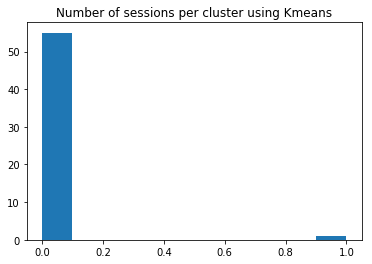

In [16]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
plt.title("Number of sessions per cluster using Kmeans")
plt.hist(labels_kmeans)


(array([17.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 39.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 10 Patch objects>)

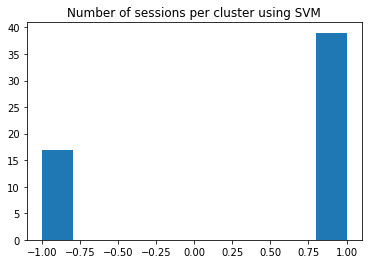

In [17]:
centers_svm,labels_svm = wcm.get_svm_clusters(norm_array_list)
plt.title("Number of sessions per cluster using SVM")
plt.hist(labels_svm)

## 4. Measure the distance between the clusters centroids

In [18]:
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
svm_axis = centers_svm[1] - centers_svm[0]

## 5. Matrices projection

In [19]:
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
svm_indicator_matrices = map(lambda x: np.dot(x,svm_axis),norm_array_list)

## 6. Plot matrices by kmeans indicator

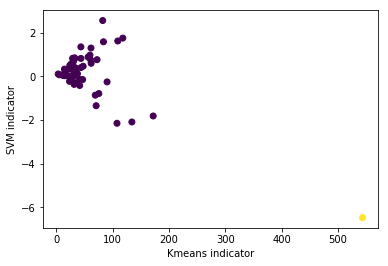

In [20]:
plt.ylabel('SVM indicator')
plt.xlabel('Kmeans indicator')
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_kmeans)
plt.show()

Plotting session length vs kmeans indicator

47.1073214286


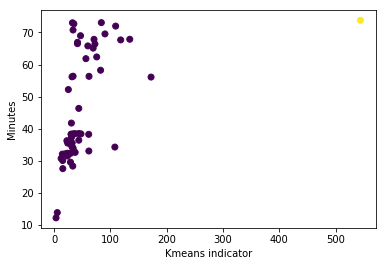

In [21]:
documents_length_audio = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_length_audio.append(document_length[name])
plt.ylabel('Minutes')
plt.xlabel('Kmeans indicator')
plt.scatter(kmeans_indicator_matrices,documents_length_audio,c=labels_kmeans)
print sum(documents_length_audio)/len(documents_length_audio)

In [22]:
index_outlier = list(labels_kmeans).index(1)
names_matrices[45]

'1497461681524'

## Get new clusterization with kmeans, n= 3

(array([44.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0., 11.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

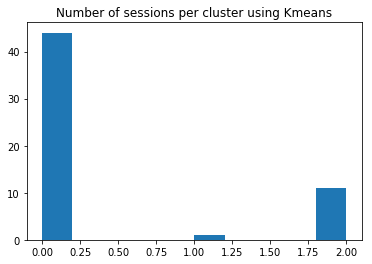

In [23]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,3)
plt.title("Number of sessions per cluster using Kmeans")
plt.hist(labels_kmeans)

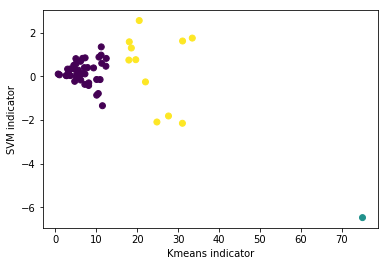

In [25]:
kmeans_axis = centers_kmeans[2] - centers_kmeans[0]
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
plt.ylabel('SVM indicator')
plt.xlabel('Kmeans indicator')
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_kmeans)
plt.show()

In [26]:
labels_kmeans = map(lambda x: 1 if x>0 else 0,labels_kmeans)
labels_kmeans_all_words = map(lambda x: 1 if x>0 else 0,labels_kmeans)

Plotting session length by number of words per session, colored by clusterization

In [27]:
documents_n_words = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_n_words.append(len(all_documents_dict[name].split()))

288510


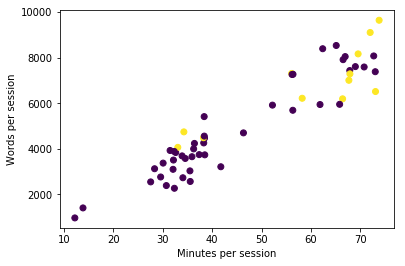

In [28]:
plt.xlabel('Minutes per session')
plt.ylabel('Words per session')
plt.scatter(documents_length_audio,documents_n_words,c=labels_kmeans)
print sum(documents_n_words)

Here we show the most frequent pair of words by lesson

Cluster 0

In [29]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 0:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 0
-------------------
está -> campo
si -> carga
positivo -> negativo
carga -> positiva
va -> ser
condensador -> carga
carga -> condensador
carga -> voltaje
campo -> magnético
campo -> eléctrico
-------------------
Document 1
-------------------
luz -> dos
poder -> hacer
qué -> va
agua -> puede
agua -> dentro
si -> está
hacer -> si
qué -> hace
entonces -> ahí
agua -> turbina
-------------------
Document 2
-------------------
distancia -> tiempo
tiempo -> final
velocidad -> 20
velocidad -> segundo
10 -> 20
metros -> segundo
aumenta -> velocidad
velocidad -> final
altura -> 10
velocidad -> tiempo
-------------------
Document 4
-------------------
qué -> sonido
quiere -> decir
va -> mayor
qué -> pasa
más -> rápido
sonido -> está
sonido -> puede
mayor -> temperatura
sonido -> va
va -> más
-------------------
Document 5
-------------------
agua -> está
agua -> va
temperatura -> está
está -> pasando
hoy -> día
masa -> aire
diferencia -> temperatura
medida -> va
0 -> grados
masa -> ag

Cluster 1

In [30]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 1:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 3
-------------------
campo -> va
va -> fuerza
velocidad -> campo
cómo -> va
va -> hacia
si -> va
si -> corriente
va -> corriente
va -> ser
campo -> magnético
-------------------
Document 12
-------------------
gravedad -> tiempo
si -> va
va -> velocidad
qué -> va
tiempo -> cuadrado
va -> ser
velocidad -> va
velocidad -> tiempo
hacia -> arriba
velocidad -> inicial
-------------------
Document 15
-------------------
torque -> fuerza
si -> está
fuerza -> va
entonces -> fuerza
cuerpo -> fuerza
fuerza -> radio
fuerza -> cuerpo
fuerza -> está
si -> fuerza
va -> ser
-------------------
Document 18
-------------------
color -> luz
ver -> luz
color -> está
color -> rojo
ejemplo -> si
usted -> luz
qué -> color
luz -> color
si -> luz
luz -> blanca
-------------------
Document 20
-------------------
qué -> energía
torque -> fuerza
cuerpo -> va
fuerza -> radio
tipo -> energía
puede -> ser
va -> ser
fuerza -> normal
ejemplo -> fuerza
fuerza -> roce
-------------------
Document 25
---------

## 7. Get cumulative distribution by pair of words by cluster

#### 7.1 Split matrices by cluster

In [38]:
matrices_cluster1 = []
matrices_cluster0 = []
for i in range(len(labels_kmeans)):
    if labels_kmeans[i]:
        matrices_cluster1.append(norm_array_list[i])
    else:
        matrices_cluster0.append(norm_array_list[i])        

#### 7.2 Transform the list of matrices into a list with list of pair of words frequency

In [39]:
w_ij_cluster1 = np.transpose(matrices_cluster1)
w_ij_cluster0 = np.transpose(matrices_cluster0)

For example:

$entonces \rightarrow fuerza$ ($w_{6,4}$)

índice 6*300+4 = 1804 

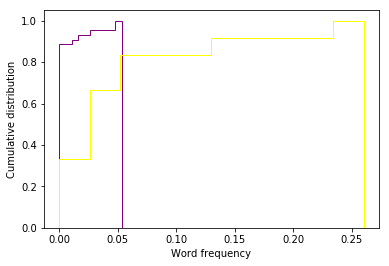

In [40]:
# plot the cumulative histogram
n, bins, patches = plt.hist(w_ij_cluster0[1804], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='purple')
n, bins, patches = plt.hist(w_ij_cluster1[1804], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='yellow')
plt.xlabel("Word frequency")
plt.ylabel("Cumulative distribution")
plt.show()

#### 7.3 Measure KS between the pair of words cumulative curves

In [41]:
ks_ij_clusters_1_0 = []
p_val_ks_ij_clusters_1_0 = []
for i in range(len(w_ij_cluster0)):
    ks = stats.ks_2samp(w_ij_cluster0[i],w_ij_cluster1[i])
    ks_ij_clusters_1_0.append(ks[0])
    p_val_ks_ij_clusters_1_0.append(ks[1])

For example, here is the KS of the combination of words $quiere \rightarrow decir$

In [43]:
ks_ij_clusters_1_0[(1804)]

0.5984848484848484

Here is the sample of pair of words in which the p_value of the ks was significative

Text(0,0.5,u'Number of pairs of words')

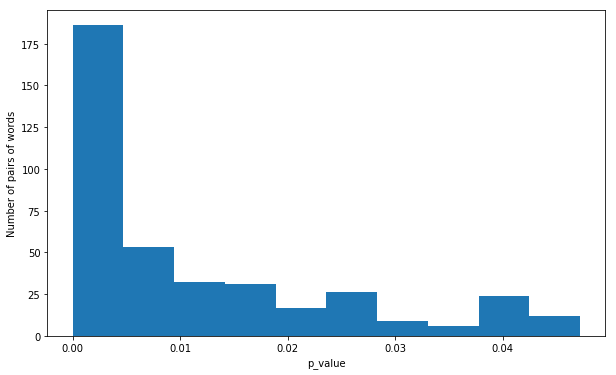

In [45]:
plt.hist(filter(lambda x: x<0.05,p_val_ks_ij_clusters_1_0))
plt.xlabel("p_value")
plt.ylabel("Number of pairs of words")

## 8. Plotting KS matrix

In [46]:
pylab.rcParams['figure.figsize'] = 20, 12

In [47]:
ks_matrix = np.reshape(ks_ij_clusters_1_0,(300,300))
print wcm.check_symmetric(ks_matrix)

False


In [48]:
df = pd.DataFrame(ks_matrix)
df.columns = set_300_most_frequent
df.index = set_300_most_frequent

In [49]:
is_1 = lambda x: 1 if x > 0 else 0

In [50]:
# count the number of documents in which the pair occurs
count_pair_c0 = map(lambda x: sum(map(is_1,x)),w_ij_cluster0)
count_pair_c1 = map(lambda x: sum(map(is_1,x)),w_ij_cluster1)

In [51]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = hv.HeatMap(wcm.to_tuple(df,count_pair_c0,count_pair_c1),vdims=['KS','cluster_0','cluster_1'])
heatmap 

:HeatMap   [x,y]   (KS,cluster_0,cluster_1)

#### Ranking ks

In [52]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(ks_matrix))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)

In [53]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_300_most_frequent[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) ser, ks:0.9090909090909091
1) va, ks:0.8863636363636364
2) hacer, ks:0.8712121212121212
3) entonces, ks:0.8636363636363636
4) usted, ks:0.8484848484848484
5) caso, ks:0.8409090909090909
6) si, ks:0.8106060606060607
7) 2, ks:0.8106060606060607
8) ir, ks:0.803030303030303
9) cuerpo, ks:0.803030303030303
10) voy, ks:0.7954545454545454
11) dije, ks:0.787878787878788
12) avanzar, ks:0.787878787878788
13) dos, ks:0.787878787878788
14) 1, ks:0.787878787878788
15) siempre, ks:0.7803030303030303
16) momento, ks:0.7803030303030303
17) sé, ks:0.7727272727272727
18) igual, ks:0.7727272727272727
19) poder, ks:0.7727272727272727


In [54]:
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_300_most_frequent[flipped[i][0]]+"->"+set_300_most_frequent[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) va->ser, ks: 0.8484848484848484
1) ser->más, ks: 0.8409090909090909
2) cuerpo->va, ks: 0.8106060606060607
3) puedo->avanzar, ks: 0.7651515151515151
4) hacer->fuerza, ks: 0.7651515151515151
5) 1->fuerza, ks: 0.75
6) puedo->hacer, ks: 0.7424242424242424
7) si->va, ks: 0.7196969696969697
8) si->fuerza, ks: 0.7196969696969697
9) va->siempre, ks: 0.712121212121212
10) poder->hacer, ks: 0.712121212121212
11) mayor->fuerza, ks: 0.7045454545454546
12) fuerza->está, ks: 0.7045454545454546
13) dónde->va, ks: 0.696969696969697
14) fuerza->va, ks: 0.696969696969697
15) ser->va, ks: 0.6893939393939393
16) va->si, ks: 0.6818181818181818
17) está->fuerza, ks: 0.6818181818181818
18) ejemplo->si, ks: 0.6742424242424243
19) va->quedar, ks: 0.6742424242424243


## 9. Plot Kmeans indicator vs SVM indicator

In [55]:
#TODO: other filters, other clusterization, and plot in 3d
pylab.rcParams['figure.figsize'] = 10, 6

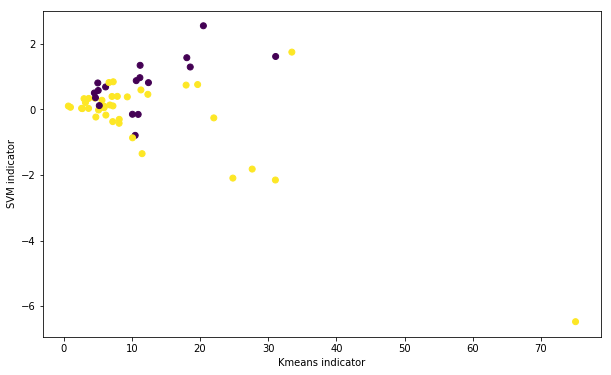

In [56]:
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_svm)
plt.ylabel("SVM indicator")
plt.xlabel("Kmeans indicator")
plt.show()

## 10. Plotting using other filters

#### Filter by positive emotions

In [57]:
from text_clustering.text_preprocessing import *

In [85]:
def get_max_clusters(labels,n):
    counter = []
    for i in range(n):
        counter.append(list(labels).count(i))
    hola = np.argsort(counter)
    reversed(hola)
    return (hola[0],hola[1])

In [86]:
n_kmeans = 3
# filtrar documentos con palabras
matrices_list_positive,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_positiva)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_positive,document_length)
else:
    norm_matrices_list = matrices_list_positive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
positive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

In [87]:
# filtrar documentos con palabras
matrices_list_negative,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_negativa)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_negative,document_length)
else:
    norm_matrices_list = matrices_list_negative
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
negative_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by expresive words

In [89]:
# filtrar documentos con palabras
matrices_list_expresive,names_matrices = wcm.get_matrices(all_documents_dict,set_expresion)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_expresive,document_length)
else:
    norm_matrices_list = matrices_list_expresive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
expresive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by experimental words

In [90]:
# filtrar documentos con palabras
matrices_list_experimental,names_matrices = wcm.get_matrices(all_documents_dict,set_experimentos)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_experimental,document_length)
else:
    norm_matrices_list = matrices_list_experimental
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
experimental_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by electric words

In [91]:
# filtrar documentos con palabras
matrices_list_electrique,names_matrices = wcm.get_matrices(all_documents_dict,set_electricidad)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_electrique,document_length)
else:
    norm_matrices_list = matrices_list_electrique
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
electrique_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by questions

In [92]:
# filtrar documentos con palabras
matrices_list_questions,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_preguntas)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_questions,document_length)
else:
    norm_matrices_list = matrices_list_questions
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
questions_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by connective words

In [93]:
# filtrar documentos con palabras
matrices_list_conective,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_conectores)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_conective,document_length)
else:
    norm_matrices_list = matrices_list_conective
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
conective_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

### Plot indicators by different filters

In [94]:
len(questions_indicator)

56

In [95]:
df = pd.DataFrame(data= {'cluster':labels_kmeans_all_words,'I_question': questions_indicator,'I_experimental': experimental_indicator,'I_expresive': expresive_indicator,'I_positive': positive_indicator,'I_negative': negative_indicator, 'I_electrique': electrique_indicator,'I_connective': conective_indicator,'I_kmeans': kmeans_indicator_matrices},)

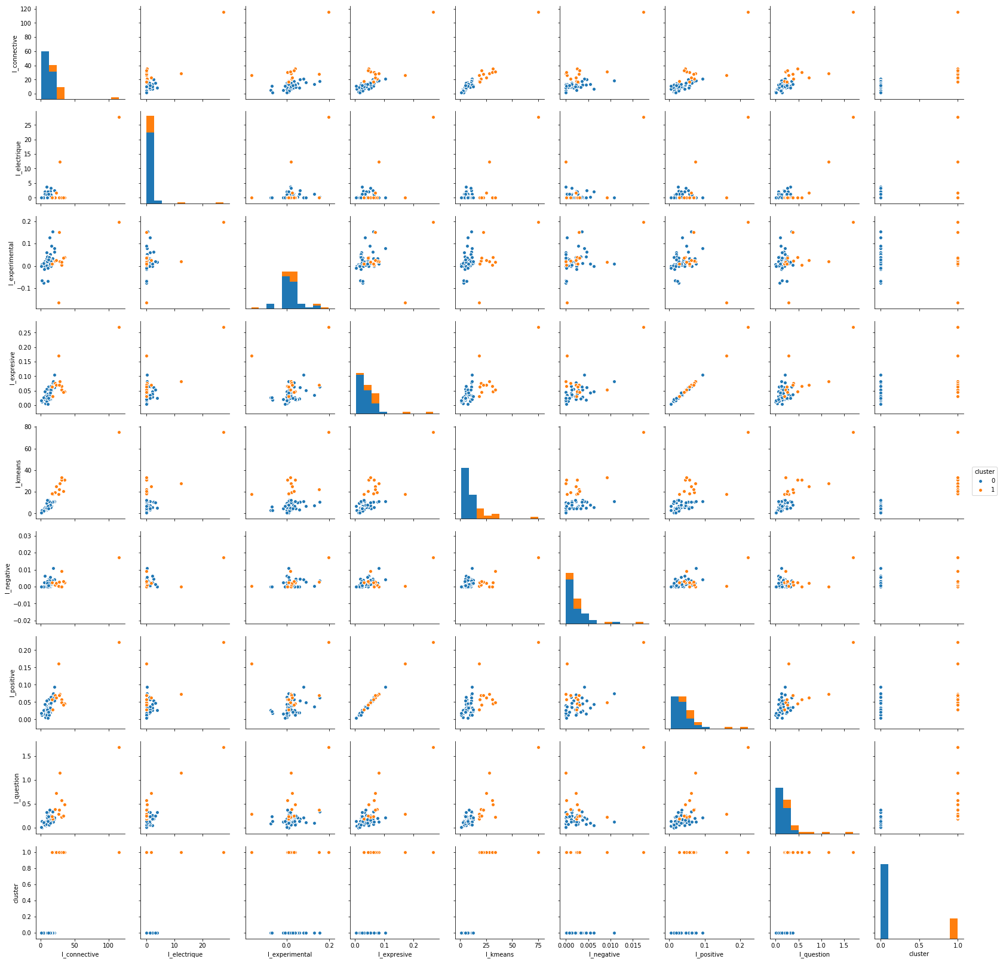

In [96]:
sns.pairplot(df, hue="cluster")

### Sacar matrix con todas palabras enzo

In [98]:
# filtrar documentos con palabras
# algunas palabras tienen dos palabras
matrices_filtered,names_matrices_filtered = wcm.get_matrices_phrases(all_documents_dict,set_all)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_filtered,document_length)
else:
    norm_matrices_list = matrices_filtered
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

In [99]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
clusters_max = get_max_clusters(labels_kmeans,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
matrices_cluster1 = []
matrices_cluster0 = []
labels_kmeans = map(lambda x: 1 if x>0 else 0,labels_kmeans)
for i in range(len(labels_kmeans)):
    if labels_kmeans[i]:
        matrices_cluster1.append(norm_array_list[i])
    else:
        matrices_cluster0.append(norm_array_list[i])        
w_ij_cluster1 = np.transpose(matrices_cluster1)
w_ij_cluster0 = np.transpose(matrices_cluster0)
ks_ij_clusters_1_0 = []
p_val_ks_ij_clusters_1_0 = []
for i in range(len(w_ij_cluster0)):
    ks = stats.ks_2samp(w_ij_cluster0[i],w_ij_cluster1[i])
    ks_ij_clusters_1_0.append(ks[0])
    p_val_ks_ij_clusters_1_0.append(ks[1])

In [100]:
ks_matrix = np.reshape(ks_ij_clusters_1_0,(len(set_all),len(set_all)))
print wcm.check_symmetric(ks_matrix)
# count the number of documents in which the pair occurs
count_pair_c0 = map(lambda x: sum(map(is_1,x)),w_ij_cluster0)
count_pair_c1 = map(lambda x: sum(map(is_1,x)),w_ij_cluster1)

False


In [101]:
df = pd.DataFrame(ks_matrix)
df.columns = map(lambda x: x.replace(" ",""),set_all)
df.index =  map(lambda x: x.replace(" ",""),set_all)

In [102]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = hv.HeatMap(wcm.to_tuple(df,count_pair_c0,count_pair_c1),vdims=['KS','cluster_0','cluster_1'])
heatmap 

:HeatMap   [x,y]   (KS,cluster_0,cluster_1)

#### Ranking KS

##### Ranking diagonal (over word frequency)

In [103]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_all[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) porque, ks:1.0
1) pero, ks:0.8333333333333334
2) medi, ks:0.8095238095238095
3) luego, ks:0.7857142857142858
4) bien, ks:0.7857142857142857
5) entonces, ks:0.7380952380952381
6) medio, ks:0.6666666666666667
7) cuándo, ks:0.6428571428571429
8) abajo, ks:0.6428571428571429
9) antes, ks:0.6428571428571428
10) también, ks:0.6190476190476191
11) asi, ks:0.6190476190476191
12) relaci, ks:0.6190476190476191
13) además, ks:0.5714285714285714
14) vien, ks:0.5714285714285714
15) después, ks:0.5714285714285714
16) por ejemplo, ks:0.5476190476190477
17) ejemplo, ks:0.5476190476190477
18) cómo, ks:0.5476190476190477
19) pues, ks:0.5476190476190477


##### Ranking pair of words

In [104]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(set_all))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_all[flipped[i][0]]+"->"+set_all[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) pero->porque, ks: 0.5952380952380953
1) por ejemplo->ejemplo, ks: 0.5714285714285714
2) en cambio->cambio, ks: 0.5476190476190476
3) a medida->medi, ks: 0.5238095238095238
4) porque->bien, ks: 0.5
5) porque->medi, ks: 0.4761904761904762
6) abajo->porque, ks: 0.45238095238095233
7) mal->porque, ks: 0.45238095238095233
8) derecha->izquierda, ks: 0.4047619047619048
9) porque->abajo, ks: 0.40476190476190477
10) porque->entonces, ks: 0.38095238095238093
11) porque->cómo, ks: 0.3571428571428572
12) medi->porque, ks: 0.3571428571428572
13) ejemplo->porque, ks: 0.33333333333333337
14) porque->pero, ks: 0.3333333333333333
15) material->ejemplo, ks: 0.33333333333333326
16) también->porque, ks: 0.33333333333333326
17) vien->después, ks: 0.33333333333333326
18) pero->ejemplo, ks: 0.30952380952380953
19) luego->porque, ks: 0.2857142857142857
